## Lab 08

In [1]:
from __future__ import print_function

import pandas as pd
import matplotlib.pyplot as plt
from numpy import *
from sklearn import *
import warnings
warnings.filterwarnings('ignore')

# sklearn 10FCV
from sklearn.preprocessing import LabelEncoder
import sklearn.preprocessing

# Keras
import tensorflow as tf
from tensorflow import keras
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import GaussianNoise
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping

#XAI
import lime
import lime.lime_tabular
import shap

seed = 1
np.random.seed(seed)
tf.random.set_seed(seed)

plt.rcParams["figure.figsize"] = (12,5)
%matplotlib inline

## Question 01: Tabular Dataset (Adult Dataset)

In [2]:
data = pd.read_csv("../Week 03/adult.csv")

# Used to label encode categorical values
feature_names = ["Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital Status","Occupation", "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss","Hours per week", "Country"]

dataT = data.values

labels = dataT[:,14]
le= sklearn.preprocessing.LabelEncoder()
le.fit(labels)
labels = le.transform(labels)
class_names = le.classes_
dataT = dataT[:,:-1]


categorical_features = [1,3,5,6,7,8,9,13]
categorical_names = {}
for feature in categorical_features:
    le = sklearn.preprocessing.LabelEncoder()
    le.fit(dataT[:, feature])
    dataT[:, feature] = le.transform(dataT[:, feature])
    categorical_names[feature] = le.classes_

In [3]:
dataT = dataT.astype(float)

np.random.seed(1)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(dataT, labels, train_size=0.80)

Train on 17452 samples, validate on 8596 samples
Epoch 1/10
17452/17452 [==============================] - 1s 80us/sample - loss: 5389.0825 - acc: 0.7597 - val_loss: 949.5029 - val_acc: 0.7612
Epoch 2/10
17452/17452 [==============================] - 0s 6us/sample - loss: 271.5892 - acc: 0.6233 - val_loss: 170.1086 - val_acc: 0.7648
Epoch 3/10
17452/17452 [==============================] - 0s 6us/sample - loss: 68.1560 - acc: 0.6898 - val_loss: 5.9480 - val_acc: 0.7804
Epoch 4/10
17452/17452 [==============================] - 0s 6us/sample - loss: 27.4280 - acc: 0.6610 - val_loss: 24.8146 - val_acc: 0.7927
Epoch 5/10
17452/17452 [==============================] - 0s 6us/sample - loss: 21.5547 - acc: 0.6932 - val_loss: 10.3526 - val_acc: 0.2621
Epoch 6/10
17452/17452 [==============================] - 0s 5us/sample - loss: 13.0447 - acc: 0.6938 - val_loss: 5.2820 - val_acc: 0.7793
Epoch 7/10
17452/17452 [==============================] - 0s 5us/sample - loss: 24.6205 - acc: 0.6785 - val

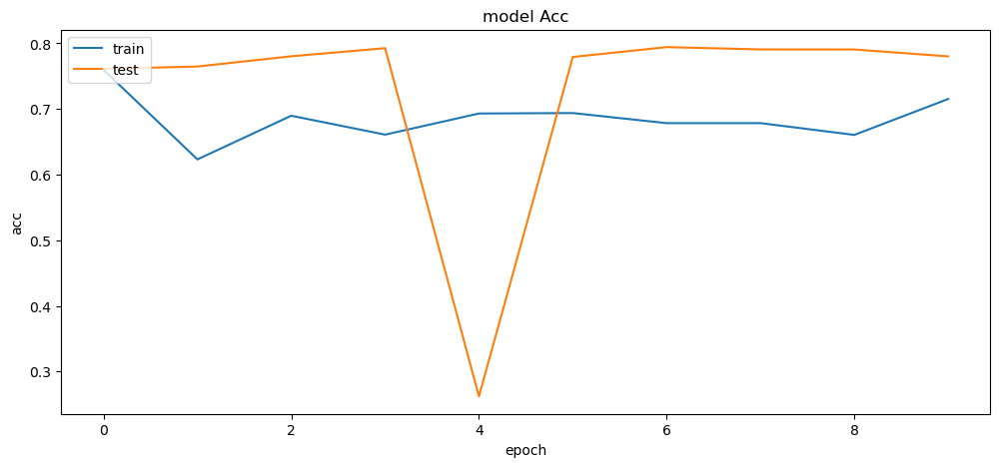

In [4]:
# fix random seed for reproducibility
seed = 1
np.random.seed(seed)
tf.random.set_seed(seed) # for TF this needs to be run per cell.


model = Sequential()
model.add(Dense(100, input_dim=14, activation='relu'))
model.add(Dense(10, activation='relu'))
model.add(Dense(2, activation='softmax'))

# Compile model
model.compile(loss='sparse_categorical_crossentropy', optimizer="adam", metrics=['acc'])

# Fit the model, but this time store the history (that is accuracy and loss for each Epoch)
results = model.fit(train, labels_train, validation_split=0.33, epochs=10, batch_size=1000, verbose=1, shuffle=True)

# summarize history for loss
plt.plot(results.history['acc'])
plt.plot(results.history['val_acc'])
plt.title('model Acc')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### Lime - Single Prediction
- https://github.com/marcotcr/lime

In [5]:
explainer = lime.lime_tabular.LimeTabularExplainer(train,
                                                   feature_names = feature_names,
                                                   class_names=class_names,
                                                   categorical_features=categorical_features, 
                                                   categorical_names=categorical_names, 
                                                   kernel_width=3)


exp = explainer.explain_instance(test[1], model.predict_proba, num_features=5)
exp.show_in_notebook(show_all=True)

In [6]:
preds = model.predict_classes(test)
false_preds = np.argwhere((preds != labels_test)).flatten()

idx  = random.choice(false_preds, size = 5)

for num in idx:
    print("Prediction : ", class_names[model.predict_classes(test[num].reshape(1,-1))[0]])
    print("Actual :     ", class_names[labels_test[num]])
    exp = explainer.explain_instance(test[num], model.predict_proba, num_features=5)
    exp.show_in_notebook(show_all=False)


Prediction :  <=50K
Actual :      >50K


Prediction :  <=50K
Actual :      >50K


Prediction :  <=50K
Actual :      >50K


Prediction :  <=50K
Actual :      >50K


Prediction :  <=50K
Actual :      >50K


### Shap - Explaining a model
- https://interpret.ml/docs/shap.html
- https://github.com/slundberg/shap

In [7]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

In [8]:
import numpy as np
from sklearn.model_selection import train_test_split

from interpret import show
from interpret.blackbox import ShapKernel

# This can be very compute consuming and OOM erros
shapML = ShapKernel(model.predict_proba, 
                    train[:100],
                    feature_names=feature_names)
shap_local = shapML.explain_local(test[:5], labels_test[:5])
show(shap_local, 0)

  0%|          | 0/5 [00:00<?, ?it/s]

In [9]:
xplainer = shap.KernelExplainer(model, train[:200])
shap_values = xplainer.shap_values(test[:5])


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/5 [00:00<?, ?it/s]

The waterfall plot also allows us to see the amplitude and the nature of the impact of a feature. It also allows seeing the order of importance of the features and the values taken by each feature for the sample.

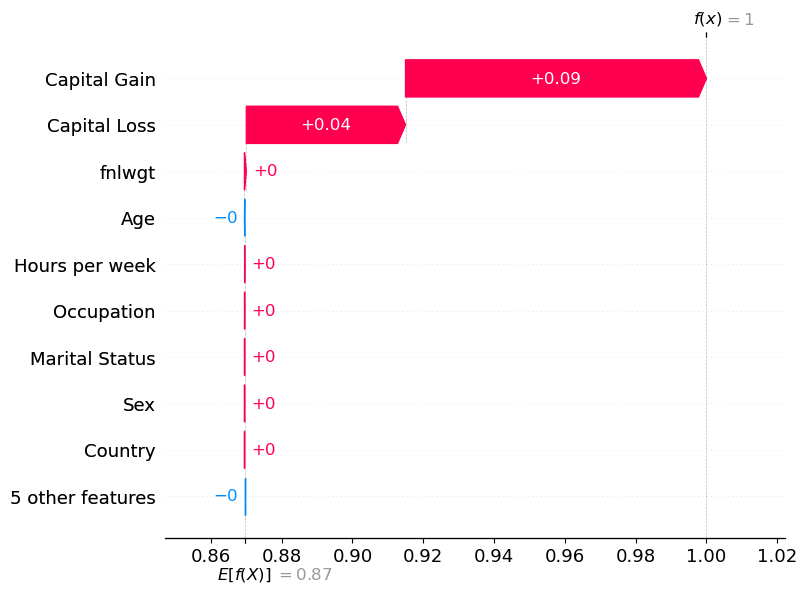

In [10]:
shap.initjs()
shap.plots._waterfall.waterfall_legacy(xplainer.expected_value[0], shap_values[0][0], feature_names=feature_names)

The force plot is good to see where the “output value” fits in relation to the “base value”. We also see which features have a positive (red) or negative (blue) impact on the prediction and the magnitude of the impact.

In [11]:
shap.initjs()
shap.plots.force(xplainer.expected_value[0], shap_values[0][0], feature_names=feature_names)

The summary plot shows the most important features and the magnitude of their impact on the model. It is the global interpretation.

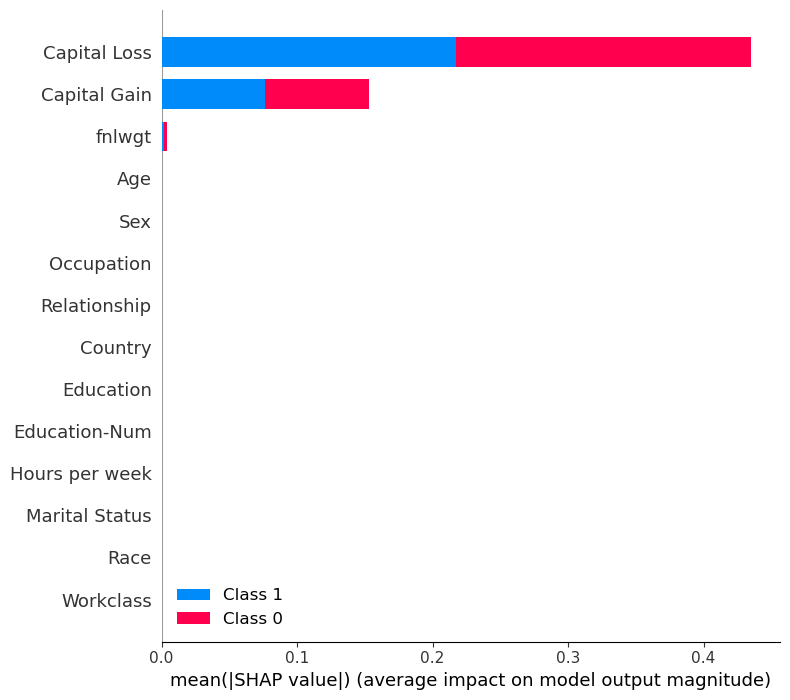

In [12]:
shap.initjs()
shap.summary_plot(shap_values, test, plot_type="bar", feature_names=feature_names)

We not using this time for the decision plot

*** The decision plot makes it possible to observe the amplitude of each change, taken by a sample for the values of the displayed features. ***

## Question 02: Images (Dogs)

In [13]:
# Tensorflow 2
import tensorflow as tf
from tensorflow import keras
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical


from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten


import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline  

from PIL import Image
import glob

In [14]:
# fix random seed for reproducibility
seed = 1
np.random.seed(seed)
tf.random.set_seed(seed)

# 64 and bigger ran into an OOM
w, h = 64, 64

# Load data
X, Y =[], []

for filename in glob.glob('../Week 04/Borzoi/*.jpg'):
    im = Image.open(filename)
    im = im.resize((w,h),Image.ANTIALIAS)
    arr = np.array(im)
    X.append(arr)
    Y.append(0)  # Borzoi class 

# same below
for filename in glob.glob('../Week 04/Maltese/*.jpg'):
    im = Image.open(filename)
    im = im.resize((w,h),Image.ANTIALIAS)
    arr = np.array(im)
    X.append(arr)
    Y.append(1)  # Maltese class

# Convert to NP array
# reshape to be [samples][channels][width][height]
# Normalize the data
X = np.array(X)
X = X.reshape(X.shape[0], w, h, 3).astype('float32')
X = X /255

# one hot encode outputs
Y = np.array(Y)

# randomize the data set - numpy arrays
randomize = np.arange(len(X))
np.random.shuffle(randomize)
X = X[randomize]
Y = Y[randomize]

Y = to_categorical(Y)
num_classes = Y.shape[1]

### Model Training

Train on 270 samples, validate on 133 samples
Epoch 1/10
270/270 [==============================] - 3s 12ms/sample - loss: 2.6665 - acc: 0.5185 - val_loss: 1.6077 - val_acc: 0.6090
Epoch 2/10
270/270 [==============================] - 0s 550us/sample - loss: 0.8678 - acc: 0.5519 - val_loss: 0.6705 - val_acc: 0.5639
Epoch 3/10
270/270 [==============================] - 0s 544us/sample - loss: 0.5852 - acc: 0.6519 - val_loss: 0.5947 - val_acc: 0.6917
Epoch 4/10
270/270 [==============================] - 0s 548us/sample - loss: 0.4853 - acc: 0.7889 - val_loss: 0.5462 - val_acc: 0.7368
Epoch 5/10
270/270 [==============================] - 0s 543us/sample - loss: 0.4061 - acc: 0.8407 - val_loss: 0.5437 - val_acc: 0.7218
Epoch 6/10
270/270 [==============================] - 0s 544us/sample - loss: 0.3640 - acc: 0.8519 - val_loss: 0.5086 - val_acc: 0.7519
Epoch 7/10
270/270 [==============================] - 0s 541us/sample - loss: 0.2832 - acc: 0.9111 - val_loss: 0.5210 - val_acc: 0.7669
Epo

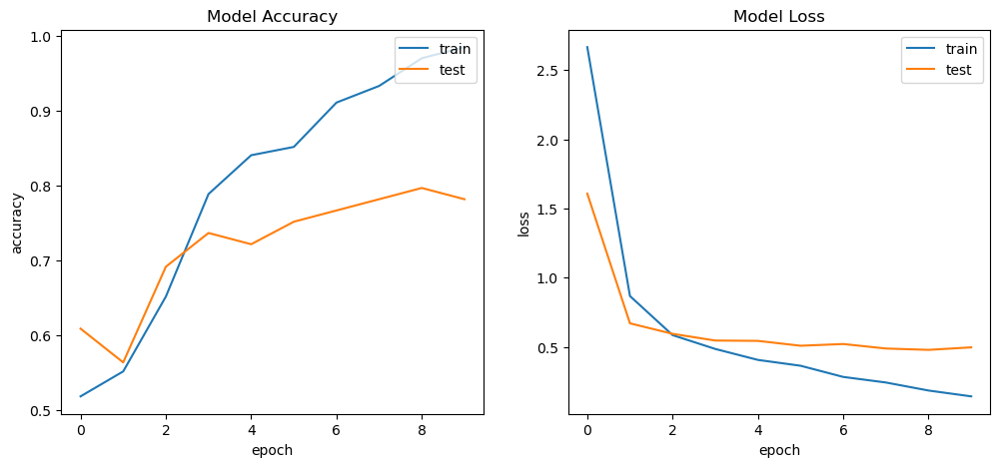

In [15]:
np.random.seed(10)
tf.random.set_seed(10)

modelC = Sequential()
modelC.add(Conv2D(32, (3, 3), strides=1, padding="valid", input_shape=(w, h,3), activation='relu',))
modelC.add(MaxPooling2D(pool_size=(2, 2), padding="valid"))
modelC.add(Flatten())
modelC.add(Dense(128, activation='relu'))
modelC.add(Dense(num_classes, activation='softmax'))

modelC.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])
history = modelC.fit(X, Y, validation_split=0.33, epochs=10, batch_size=32, verbose=1)

# summarize history for accuracy
plt.subplot(1,2,1)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')

plt.subplot(1,2,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

### Lime Explainer

In [16]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

explainer = lime_image.LimeImageExplainer(random_state=1)

def make_prediction(image):
    preds = modelC.predict(image)
    return preds

explanation = explainer.explain_instance(X[0].squeeze(), make_prediction, random_seed=1)

  0%|          | 0/1000 [00:00<?, ?it/s]

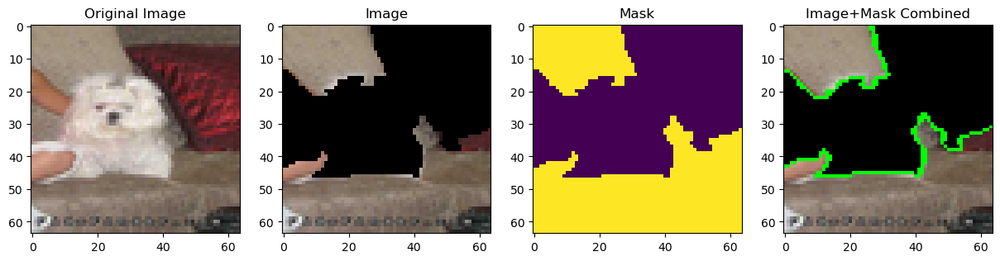

In [17]:
#as we used OHE we need to get class value: np.argmax(Y[0])
img, mask = explanation.get_image_and_mask(np.argmax(Y[0]), positive_only=True, hide_rest=True)

from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

def plot_comparison(main_image, img, mask):
    fig = plt.figure(figsize=(15,5))

    ax = fig.add_subplot(141)
    ax.imshow(main_image, cmap="gray");
    ax.set_title("Original Image")
    ax = fig.add_subplot(142)
    ax.imshow(img);
    ax.set_title("Image")
    ax = fig.add_subplot(143)
    ax.imshow(mask);
    ax.set_title("Mask")
    ax = fig.add_subplot(144)
    ax.imshow(mark_boundaries(img, mask, color=(0,1,0)));
    ax.set_title("Image+Mask Combined");

plot_comparison(X[0], img, mask)

### Shap - DeepExplainer

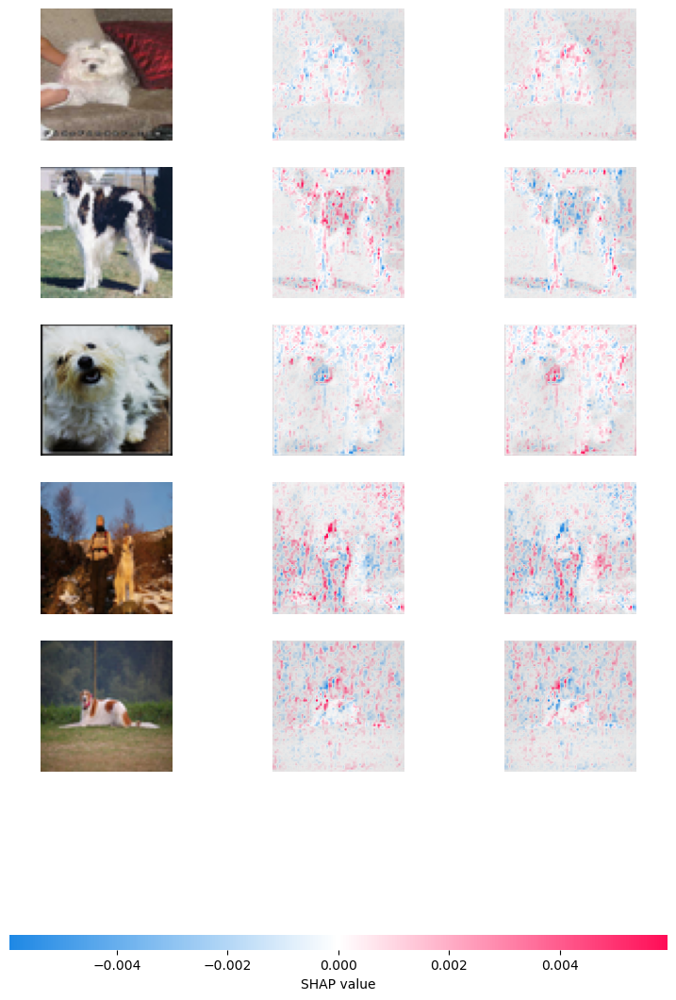

In [18]:
xplainer = shap.DeepExplainer(modelC, X[:10])
shap_values = xplainer.shap_values(X[0:5]) 
shap.image_plot(shap_values, X[0:5])

In this visualization:
- Red pixels represent positive SHAP values that contributed to classifying that image as that particular class.
- Blue pixels represent negative SHAP values that contributed to not classifying that image as that particular class.

## Question 04: LSTM (NLP)

### Model Training

In [19]:
import sklearn
import sklearn.ensemble
import sklearn.metrics

#Raw dataset
X, y = shap.datasets.imdb()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)

print(X_train[0])
print(y_train[0])

y_train=y_train[:1000]
y_test=y_test[:1000]
X_train = X_train[:1000]
X_test = X_test[:1000]

vectorizer = sklearn.feature_extraction.text.TfidfVectorizer(min_df=10)
X_train_vec = vectorizer.fit_transform(X_train).toarray()
X_test_vec = vectorizer.transform(X_test).toarray()

class_names = ['Negative', 'Positive']

rf = sklearn.ensemble.RandomForestClassifier(n_estimators=500)
rf.fit(X_train_vec, y_train)

pred = rf.predict(X_test_vec)

print(pred[0])

The movie is a total crap. We have two good actors who are miscast and a meat-head of an actor Salman Khan just to attract the female audience. The story is a crap. The characters poorly sketched. Non existent story telling. No editing to speak of. Ajay Devgan as a Rock Star..that is a dream in itself. The movie drags along to the point of decadence. The whole charade about Arjun bringing his Manna to London, let him grope his girlfriend and let him not play at Wembley (Vimbley in the dubbing process) is absurd. Salman Khan's over the top acting or faking is too painful to watch. I remember seeing some good movies from this Producer Vipul Shah but this is not one of them. It seems all the good directors are falling prey to the Box Office mania..that the Mumbai Media Morons have created. This is yet another crap movie in the lines of "Wanted" with idiot actor like Salman Khan who has no place in a Good Hindi Cinema. He is good to the Indian Cinema as Titanic was to the Winter Cruise Bus

### Lime Explainer
- Adapted from: https://github.com/marcotcr/lime/blob/master/doc/notebooks/Lime%20-%20basic%20usage%2C%20two%20class%20case.ipynb

In [26]:
from sklearn.pipeline import make_pipeline
c = make_pipeline(vectorizer, rf)

print("Predict probability: ", c.predict_proba([X_test[0]]))

from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)

i = 0
exp = explainer.explain_instance(X_test[i], c.predict_proba, num_features=10)
print('Probability =', c.predict_proba([X_test[i]])[0, 1])
print('True class: %s' % class_names[y_test[i]])

Predict probability:  [[0.668 0.332]]
Probability = 0.332
True class: Negative


In [27]:
exp.as_list()

[('awful', -0.05304851020508354),
 ('stupid', -0.0511713837122969),
 ('worse', -0.02978477124010214),
 ('why', -0.02402223014727277),
 ('movie', -0.019616452329270194),
 ('premise', -0.018850243362851873),
 ('make', -0.016404548612922357),
 ('and', 0.015863102723237175),
 ('the', 0.01200065327672816),
 ('in', 0.008720521896168112)]

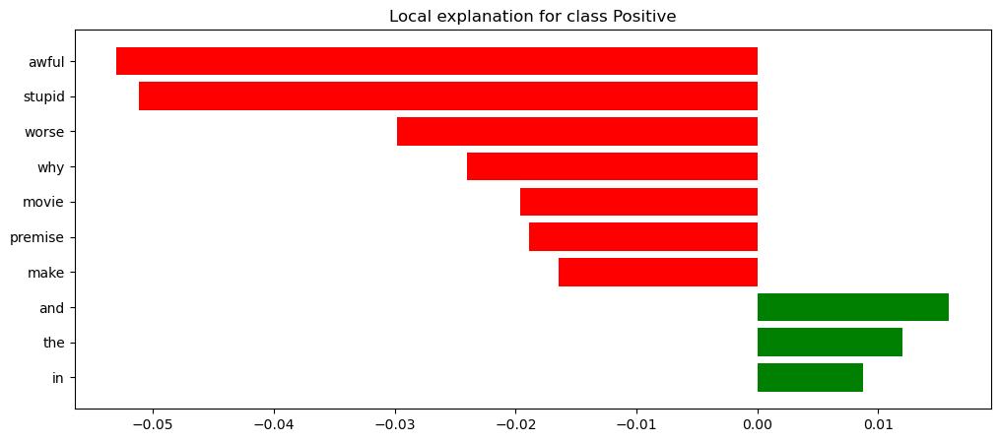

In [28]:
fig = exp.as_pyplot_figure()

In [29]:
exp.show_in_notebook(text=True)

### Shap Explainer

In [24]:
feature_names = vectorizer.get_feature_names_out()
explainer = shap.Explainer(rf, X_train_vec, feature_names=feature_names)
shap_values = explainer(X_test_vec)
print(shap_values.values.shape) # (5000, 16438, 2)

100%|===================| 1999/2000 [04:27<00:00]        

(1000, 1940, 2)


Stephen King is generally known for the morbid, and that's fine, but this story is too morbid. Some movies, by the end you feel sad for the characters or the situations they were put through...here you just feel depressed. The movie has a nice feel to it (at first), with the family moving to the country, and creepy old Fred Gwyne greeting and warning them of the pet cemetery, but this plot leads nowhere. It starts with so much potential, but by the end, it loses the potential to be a good horror movie, and becomes corny, extremely stupid, and ultimately depressing.<br /><br />Louis (Dale Midkoff), his wife Rachel (Denise Crosby), their kids Ellie and Gage, and their cat move to a new home in Maine. They are warned by the loony farmer neighbor Jud (Fred Gwyne) about the local pet cemetery and how it is cursed. Louis thinks nothing of this and everything's fine until the family cat is killed. He bury's it in the cursed cemetery and it comes back to life, constantly hissing at the family 

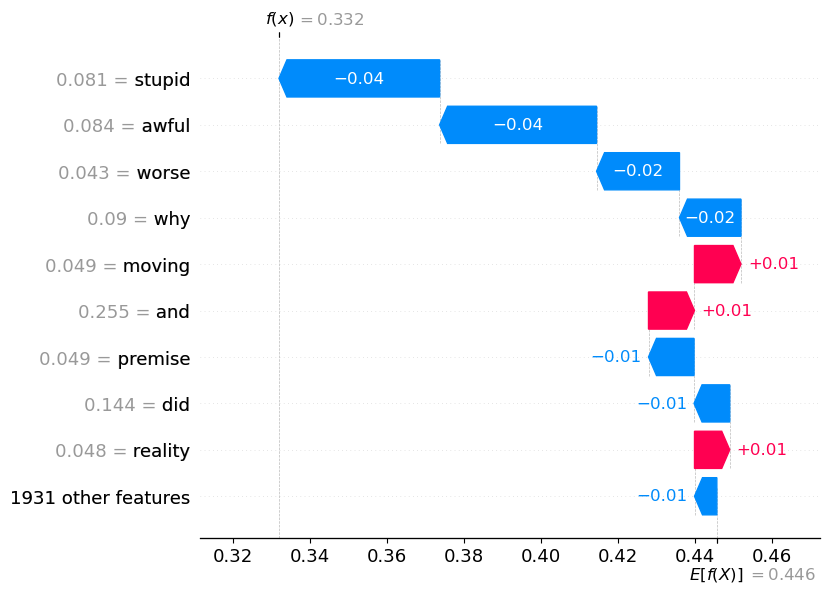

In [30]:
i = 0
print(X_test[i])

shap.initjs()
shap.plots.waterfall(shap_values[i,:,1])